# Inference Notebook with Pseudo Labelling using train + test images
This notebook can be used for D0-D7 EfficientDet pytorch models. Designed for single model.

## 1. Installing dependencies
Designed for Kaggle Code competition with internet restrictions so takes offline datasets as input.
Change the directories as required while reproducing locally.

In [1]:
!pip install --no-deps '../input/timm-package/timm-0.1.26-py3-none-any.whl' > /dev/null
!pip install --no-deps '../input/pycocotools/pycocotools-2.0-cp37-cp37m-linux_x86_64.whl' > /dev/null

In [2]:
import sys

sys.path.insert(0, "../input/timm-efficientdet-pytorch")
sys.path.insert(0, "../input/omegaconf")
sys.path.insert(0, "../input/weightedboxesfusion")
sys.path.insert(0, "../input/nvidia-apex/apex-master")

import torch
import os
from datetime import datetime
import time
import random
import cv2
import pandas as pd
import numpy as np
import albumentations as A
import matplotlib.pyplot as plt
from albumentations.pytorch.transforms import ToTensorV2
from sklearn.model_selection import StratifiedKFold
from torch.utils.data.sampler import SequentialSampler, RandomSampler
from glob import glob
from effdet import get_efficientdet_config, EfficientDet, DetBenchTrain,DetBenchEval
from effdet.efficientdet import HeadNet
from ensemble_boxes import *
from torch.utils.data import Dataset, DataLoader
import gc
import re
from tqdm import tqdm
import apex.amp as amp

SEED = 42

def seed_everything(seed):
    random.seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.backends.cudnn.deterministic = True    # This is ignored by torch - deterministic nature will always be random!
    torch.backends.cudnn.benchmark = True

seed_everything(SEED)

## 2. Configurations for Pseudo Labelling

In [3]:
COMMIT=len(os.listdir('../input/global-wheat-detection/test/'))<11   # Bool to save commit time

Round_N = 1    # Number of PL rounds
is_TTA=True    # TTA for Pseudo Label predictions

score_threshold=0.35    # final skip threshold for PL preds
IOU_THR=0.6    # IOU threshold for WBF
SKIP_THR=0.1    # SKIP threshold for WBF

fact = -0.025/2   # 2*fact reduction in bbox dimensions, applied by default, use 0 for no change
alter_output= False    # Condition for altering output boxes too
facto= -0.025/2    # Factor for final output reshaping


class TrainGlobalConfig:
    num_workers = 4
    batch_size = 2
    n_epochs = 10    # Decided on the basis of max available submit time (9 hours)
    lr = 0.0001    # Initial LR for the scheduler (optimal value for #epochs available)

    folder = 'effdet5-cutmix-augmix-mixup'

    verbose = True
    verbose_step = 1

    step_scheduler = False  # do scheduler.step after optimizer.step
    validation_scheduler = True  # do scheduler.step after validation stage loss

    SchedulerClass = torch.optim.lr_scheduler.ReduceLROnPlateau
    scheduler_params = dict(
        mode='min',
        factor=0.5,
        patience=1,
        verbose=False,
        threshold=0.0001,
        threshold_mode='abs',
        cooldown=0,
        min_lr=1e-8,
        eps=1e-08
    )

## 3. Training Pipeline
To be used in Pseudo Labelling - covered in detail in [TRAIN] Notebook

In [5]:
# Include ShiftScaleRotate Albumentation in training alongside for better generalisation, 
# it gave us a boost in local CV scores but reduced public score hence dropped in inference.
def get_train_transforms():
    return A.Compose(
        [
            A.RandomSizedCrop(min_max_height=(800, 800), height=1024, width=1024, p=0.3),
            A.OneOf([
                A.HueSaturationValue(hue_shift_limit=0.2, sat_shift_limit=0.2,
                                     val_shift_limit=0.2, p=0.9), 
                A.RandomBrightnessContrast(brightness_limit=0.2,  
                                           contrast_limit=0.2, p=0.9),
            ], p=0.9),
            A.ToGray(p=0.01),  
            A.HorizontalFlip(p=0.5), 
            A.VerticalFlip(p=0.5),  
            A.Resize(height=1024, width=1024, p=1),  
            A.Cutout(num_holes=8, max_h_size=64, max_w_size=64, fill_value=0, p=0.5),  
            ToTensorV2(p=1.0),
        ],
        p=1.0,
        bbox_params=A.BboxParams(  
            format='pascal_voc',
            min_area=0,
            min_visibility=0,
            label_fields=['labels']
        )
    )


def get_valid_transforms():
    return A.Compose(
        [
            A.Resize(height=1024, width=1024, p=1.0),
            ToTensorV2(p=1.0),
        ],
        p=1.0,
        bbox_params=A.BboxParams(
            format='pascal_voc',
            min_area=0,
            min_visibility=0,
            label_fields=['labels']
        )
    )



class AverageMeter(object):
    """Computes and stores the average and current value"""

    def __init__(self):
        self.reset()

    def reset(self):
        self.val = 0
        self.avg = 0
        self.sum = 0
        self.count = 0

    def update(self, val, n=1):
        self.val = val
        self.sum += val * n
        self.count += n
        self.avg = self.sum / self.count

import warnings

warnings.filterwarnings("ignore")


class Fitter:

    def __init__(self, model, device, config):
        self.config = config
        self.epoch = 0

        self.base_dir = f'./{config.folder}'
        if not os.path.exists(self.base_dir):
            os.makedirs(self.base_dir)

        self.log_path = f'{self.base_dir}/log.txt'
        self.best_summary_loss = 10 ** 5

        self.model = model
        self.device = device

        param_optimizer = list(self.model.named_parameters())
        no_decay = ['bias', 'LayerNorm.bias', 'LayerNorm.weight']
        optimizer_grouped_parameters = [
            {'params': [p for n, p in param_optimizer if not any(nd in n for nd in no_decay)], 'weight_decay': 0.001},
            {'params': [p for n, p in param_optimizer if any(nd in n for nd in no_decay)], 'weight_decay': 0.0}
        ]

        self.optimizer = torch.optim.AdamW(self.model.parameters(), lr=config.lr)
        self.scheduler = config.SchedulerClass(self.optimizer, **config.scheduler_params)
        self.log(f'Fitter prepared. Device is {self.device}')
        self.model, self.optimizer = amp.initialize(self.model, self.optimizer, opt_level='O1')

    def fit(self, train_loader, validation_loader):
        for e in range(self.config.n_epochs):
            if self.config.verbose:
                lr = self.optimizer.param_groups[0]['lr']
                timestamp = datetime.utcnow().isoformat()
                self.log(f'\n{timestamp}\nLR: {lr}')

            t = time.time()
            summary_loss = self.train_one_epoch(train_loader)

            self.log(
                f'[RESULT]: Train. Epoch: {self.epoch}, summary_loss: {summary_loss.avg:.5f}, time: {(time.time() - t):.5f}')
            self.save(f'{self.base_dir}/last-checkpoint.bin')

            t = time.time()
            summary_loss = self.validation(validation_loader)

            self.log(
                f'[RESULT]: Val. Epoch: {self.epoch}, summary_loss: {summary_loss.avg:.5f}, time: {(time.time() - t):.5f}')
            if summary_loss.avg < self.best_summary_loss:
                self.best_summary_loss = summary_loss.avg
                self.model.eval()
                print("better model find at epoch:{}".format(self.epoch))
                best_weight=self.model.model.state_dict()
                self.save(f'{self.base_dir}/best-checkpoint-{str(self.epoch).zfill(3)}epoch.bin')
                for path in sorted(glob(f'{self.base_dir}/best-checkpoint-*epoch.bin'))[:-3]:
                    os.remove(path)

            if self.config.validation_scheduler:
                self.scheduler.step(metrics=summary_loss.avg)

            self.epoch += 1
        return best_weight

    def validation(self, val_loader):
        self.model.eval()
        summary_loss = AverageMeter()
        t = time.time()
        for step, (images, targets, image_ids) in enumerate(val_loader):
            if self.config.verbose:
                if step % self.config.verbose_step == 0:
                    print(
                        f'Val Step {step}/{len(val_loader)}, ' + \
                        f'summary_loss: {summary_loss.avg:.5f}, ' + \
                        f'time: {(time.time() - t):.5f}', end='\r'
                    )
            with torch.no_grad():
                images = torch.stack(images)
                batch_size = images.shape[0]
                images = images.to(self.device).float()
                boxes = [target['boxes'].to(self.device).float() for target in targets]
                labels = [target['labels'].to(self.device).float() for target in targets]

                loss, _, _ = self.model(images, boxes, labels)
                summary_loss.update(loss.detach().item(), batch_size)

        return summary_loss

    def train_one_epoch(self, train_loader):
        self.model.train()
        summary_loss = AverageMeter()
        t = time.time()
        for step, (images, targets, image_ids) in enumerate(train_loader):
            if self.config.verbose:
                if step % self.config.verbose_step == 0:
                    print(
                        f'Train Step {step}/{len(train_loader)}, ' + \
                        f'summary_loss: {summary_loss.avg:.5f}, ' + \
                        f'time: {(time.time() - t):.5f}', end='\r'
                    )
            
            images = torch.stack(images)
            images = images.to(self.device).float()
            batch_size = images.shape[0]
            boxes = [target['boxes'].to(self.device).float() for target in targets]
            labels = [target['labels'].to(self.device).float() for target in targets]

            self.optimizer.zero_grad()

            loss, _, _ = self.model(images, boxes, labels)
            
            with amp.scale_loss(loss, self.optimizer) as loss:
                loss.backward()

            summary_loss.update(loss.detach().item(), batch_size)

            self.optimizer.step()

            if self.config.step_scheduler:
                self.scheduler.step()

        return summary_loss

    def save(self, path):
        self.model.eval()
        torch.save({
            'model_state_dict': self.model.model.state_dict(),
            'optimizer_state_dict': self.optimizer.state_dict(),
            'scheduler_state_dict': self.scheduler.state_dict(),
            'best_summary_loss': self.best_summary_loss,
            'epoch': self.epoch,
        }, path)

    def load(self, path):
        checkpoint = torch.load(path)
        self.model.model.load_state_dict(checkpoint['model_state_dict'])
        self.optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
        self.scheduler.load_state_dict(checkpoint['scheduler_state_dict'])
        self.best_summary_loss = checkpoint['best_summary_loss']
        self.epoch = checkpoint['epoch'] + 1

    def log(self, message):
        if self.config.verbose:
            print(message)
        with open(self.log_path, 'a+') as logger:
            logger.write(f'{message}\n')



def collate_fn(batch):
    return tuple(zip(*batch))


def run_training(train_dataset,validation_dataset,train_net=None):
    device = torch.device('cuda:0')
    train_net.to(device)

    train_loader = torch.utils.data.DataLoader(
        train_dataset,
        batch_size=TrainGlobalConfig.batch_size,
        sampler=RandomSampler(train_dataset),
        pin_memory=False,
        drop_last=True,
        num_workers=TrainGlobalConfig.num_workers,
        collate_fn=collate_fn,
    )
    val_loader = torch.utils.data.DataLoader(
        validation_dataset,
        batch_size=TrainGlobalConfig.batch_size,
        num_workers=TrainGlobalConfig.num_workers,
        shuffle=False,
        sampler=SequentialSampler(validation_dataset),
        pin_memory=False,
        collate_fn=collate_fn,
    )

    fitter = Fitter(model=train_net, device=device, config=TrainGlobalConfig)
    best_weight = fitter.fit(train_loader, val_loader)
    return best_weight

In [6]:
import torch
import random
import cv2
import numpy as np
from torch.utils.data import Dataset

TRAIN_ROOT_PATH = '../input/global-wheat-detection/train'
TEST_ROOT_PATH = '../input/global-wheat-detection/test'

class DatasetRetriever(Dataset):

    def __init__(self, marking, image_ids, transforms=None, test=False):
        super().__init__()

        self.image_ids = image_ids
        self.marking = marking
        self.transforms = transforms
        self.test = test

    def __getitem__(self, index: int):
        image_id = self.image_ids[index]
        
        p=random.random()
        if self.test or p>0.6:
            image, boxes = self.load_image_and_boxes(index)
        elif p>0.5 :
            image, boxes = self.load_mixup_images_and_boxes(index)
        else:
            image, boxes = self.load_cutmix_image_and_boxes(index)

        # there is only one class
        labels = torch.ones((boxes.shape[0],), dtype=torch.int64)

        target = {}
        target['boxes'] = boxes
        target['labels'] = labels
        target['image_id'] = torch.tensor([index])

        if self.transforms:
            for i in range(10):
                sample = self.transforms(**{
                    'image': image,
                    'bboxes': target['boxes'],
                    'labels': labels
                })
                if len(sample['bboxes']) > 0:
                    image = sample['image']
                    target['boxes'] = torch.stack(tuple(map(torch.tensor, zip(*sample['bboxes'])))).permute(1, 0)
                    target['boxes'][:, [0, 1, 2, 3]] = target['boxes'][:, [1, 0, 3, 2]]  # yxyx: be warning
                    break

        return image, target, image_id

    def __len__(self) -> int:
        return self.image_ids.shape[0]

    def load_image_and_boxes(self, index):
        image_id = self.image_ids[index]
        if self.marking[self.marking['image_id'] == image_id]['source'].all() == 'pseudo':
            image = cv2.imread(f'{TEST_ROOT_PATH}/{image_id}.jpg', cv2.IMREAD_COLOR)
        else:
            image = cv2.imread(f'{TRAIN_ROOT_PATH}/{image_id}.jpg', cv2.IMREAD_COLOR)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB).astype(np.float32)
        image /= 255.0
        if image.shape[0]!=1024 or image.shape[1]!=1024:    #Miss me with that submission error shit
            image=cv2.resize(image, (1024,1024))
        records = self.marking[self.marking['image_id'] == image_id]
        boxes = records[['x', 'y', 'w', 'h']].values
        boxes[:, 2] = boxes[:, 0] + boxes[:, 2]
        boxes[:, 3] = boxes[:, 1] + boxes[:, 3] 
        return image, boxes

    def load_cutmix_image_and_boxes(self, index, imsize=1024):
        """
        Also known as Mosaic
        This implementation of cutmix author:  https://www.kaggle.com/nvnnghia
        Refactoring and adaptation: https://www.kaggle.com/shonenkov
        """
        w, h = imsize, imsize 
        s = imsize // 2

        xc, yc = [int(random.uniform(imsize * 0.25, imsize * 0.75)) for _ in range(2)]  
        indexes = [index] + [random.randint(0, self.image_ids.shape[0] - 1) for _ in range(3)]  

        result_image = np.full((imsize, imsize, 3), 1, dtype=np.float32) 
        result_boxes = []

        for i, index in enumerate(indexes):
            image, boxes = self.load_image_and_boxes(index)  
            if i == 0:
                x1a, y1a, x2a, y2a = max(xc - w, 0), max(yc - h, 0), xc, yc 
                x1b, y1b, x2b, y2b = w - (x2a - x1a), h - (y2a - y1a), w, h  
            elif i == 1:  # top right
                x1a, y1a, x2a, y2a = xc, max(yc - h, 0), min(xc + w, s * 2), yc
                x1b, y1b, x2b, y2b = 0, h - (y2a - y1a), min(w, x2a - x1a), h
            elif i == 2:  # bottom left
                x1a, y1a, x2a, y2a = max(xc - w, 0), yc, xc, min(s * 2, yc + h)
                x1b, y1b, x2b, y2b = w - (x2a - x1a), 0, max(xc, w), min(y2a - y1a, h)
            elif i == 3:  # bottom right
                x1a, y1a, x2a, y2a = xc, yc, min(xc + w, s * 2), min(s * 2, yc + h)
                x1b, y1b, x2b, y2b = 0, 0, min(w, x2a - x1a), min(y2a - y1a, h)
            result_image[y1a:y2a, x1a:x2a] = image[y1b:y2b, x1b:x2b]
            padw = x1a - x1b
            padh = y1a - y1b

            boxes[:, 0] += padw  
            boxes[:, 1] += padh
            boxes[:, 2] += padw
            boxes[:, 3] += padh

            result_boxes.append(boxes)

        result_boxes = np.concatenate(result_boxes, 0)
        np.clip(result_boxes[:, 0:], 0, 2 * s, out=result_boxes[:, 0:])
        result_boxes = result_boxes.astype(np.int32)
        result_boxes = result_boxes[
            np.where((result_boxes[:, 2] - result_boxes[:, 0]) * (result_boxes[:, 3] - result_boxes[:, 1]) > 0)]
        return result_image, result_boxes
    
    def load_mixup_images_and_boxes(self, index, imsize=1024, alpha=1.0):
        """
        This implementation of mixup author:  https://www.kaggle.com/ii5m0k3ii
        """
        images, bboxes = self.load_image_and_boxes(index)

        s_index = random.randint(0, self.image_ids.shape[0] - 1)
        shuffled_images, shuffled_bboxes= self.load_image_and_boxes(s_index)

        # Generate image weight (minimum 0.4 and maximum 0.6)
        #lam = np.clip(np.random.beta(alpha, alpha), 0.4, 0.6)
        lam=0.5
        
        # Weighted Mixup
        mixedup_images = lam*images + (1 - lam)*shuffled_images       
        mixedup_bboxes = np.concatenate((bboxes,shuffled_bboxes), 0)

        return mixedup_images, mixedup_bboxes

## 4. TTA (Test-Time-Augmentations) Functions
Contains general TTA such as Flip and Rotate. Also contains self implemented Scale TTA.

In [7]:
class BaseWheatTTA:
    """ author: @shonenkov """
    image_size = 1024
    s=0.67

    def augment(self, image):
        raise NotImplementedError

    def batch_augment(self, images):
        raise NotImplementedError

    def deaugment_boxes(self, boxes):
        raise NotImplementedError


class TTAHorizontalFlip(BaseWheatTTA):
    """ author: @shonenkov """
    def augment(self, image):
        return image.flip(1)

    def batch_augment(self, images):
        return images.flip(2)

    def deaugment_boxes(self, boxes):
        boxes[:, [1, 3]] = self.image_size - boxes[:, [3, 1]]
        return boxes


class TTAVerticalFlip(BaseWheatTTA):
    """ author: @shonenkov """
    def augment(self, image):
        return image.flip(2)

    def batch_augment(self, images):
        return images.flip(3)

    def deaugment_boxes(self, boxes):
        boxes[:, [0, 2]] = self.image_size - boxes[:, [2, 0]]
        return boxes


class TTARotate90(BaseWheatTTA):
    """ author: @shonenkov """
    def augment(self, image):
        return torch.rot90(image, 1, (1, 2))

    def batch_augment(self, images):
        return torch.rot90(images, 1, (2, 3))

    def deaugment_boxes(self, boxes):
        res_boxes = boxes.copy()
        res_boxes[:, [0, 2]] = self.image_size - boxes[:, [1, 3]]
        res_boxes[:, [1, 3]] = boxes[:, [2, 0]]
        return res_boxes


class TTAScale(BaseWheatTTA):
    """ author: @5m0k3 """
    def augment(self, image):
        image = scale_img(image.unsqueeze(0), self.s, same_shape=True)
        image = image.squeeze(0)
        return image

    def batch_augment(self, images):
        images = scale_img(images, self.s, same_shape=True)
        return images

    def deaugment_boxes(self, boxes):
        boxes = boxes.astype(float)
        boxes[..., :4] /= self.s
        boxes = boxes.astype(int).clip(min=0, max=self.image_size - 1)
        return boxes


class TTAHSV_or_RBC(BaseWheatTTA):
    """HSV or RBC"""
    transform = A.OneOf([
        A.HueSaturationValue(hue_shift_limit=0.2,
                             sat_shift_limit=0.2,
                             val_shift_limit=0.2,
                             p=0.5),
        A.RandomBrightnessContrast(
            brightness_limit=0.2, contrast_limit=0.2, p=0.5),
    ],
                        p=1)

    def augment(self, image):
        image = image.permute(1, 2, 0).cpu().numpy()
        image = self.transform(image=image)['image']
        return ToTensorV2()(image=image)['image']

    def batch_augment(self, images):
        batch_size = len(images)
        for i in range(batch_size):
            images[i] = self.augment(images[i])
        return images

    def deaugment_boxes(self, boxes):
        return boxes


class TTACompose(BaseWheatTTA):
    """ author: @shonenkov """
    def __init__(self, transforms):
        self.transforms = transforms

    def augment(self, image):
        for transform in self.transforms:
            image = transform.augment(image)
        return image

    def batch_augment(self, images):
        for transform in self.transforms:
            images = transform.batch_augment(images)
        return images

    def prepare_boxes(self, boxes):
        result_boxes = boxes.copy()
        result_boxes[:, 0] = np.min(boxes[:, [0, 2]], axis=1)
        result_boxes[:, 2] = np.max(boxes[:, [0, 2]], axis=1)
        result_boxes[:, 1] = np.min(boxes[:, [1, 3]], axis=1)
        result_boxes[:, 3] = np.max(boxes[:, [1, 3]], axis=1)
        return result_boxes

    def deaugment_boxes(self, boxes):
        for transform in self.transforms[::-1]:
            boxes = transform.deaugment_boxes(boxes)
        return self.prepare_boxes(boxes)

In [8]:
from itertools import product
# These set gave the best public score
tta_transforms = []
for tta_combination in product([TTAHorizontalFlip(), None], 
                               [TTAVerticalFlip(), None],
                               [TTARotate90(), None]):
    tta_transforms.append(TTACompose([tta_transform for tta_transform in tta_combination if tta_transform]))

In [9]:
def get_test_transforms():
    return A.Compose([
        A.Resize(height=1024, width=1024, p=1.0),
        ToTensorV2(p=1.0),
    ], p=1.0)

DATA_ROOT_PATH = '../input/global-wheat-detection/test'

class DatasetRetriever_test(Dataset):

    def __init__(self, image_ids, transforms=None):
        super().__init__()
        self.image_ids = image_ids
        self.transforms = transforms

    def __getitem__(self, index: int):
        image_id = self.image_ids[index]
        image = cv2.imread(f'{DATA_ROOT_PATH}/{image_id}.jpg', cv2.IMREAD_COLOR)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB).astype(np.float32)
        image /= 255.0
        if self.transforms:
            sample = {'image': image}
            sample = self.transforms(**sample)
            image = sample['image']
        return image, image_id

    def __len__(self) -> int:
        return self.image_ids.shape[0]

dataset = DatasetRetriever_test(
    image_ids=np.array([path.split('/')[-1][:-4] for path in glob(f'{DATA_ROOT_PATH}/*.jpg')]),
    transforms=get_test_transforms()
)


def collate_fn(batch):
    return tuple(zip(*batch))

def alter_boxes(boxes, factor=fact):
    """
    Neat little trick for bounding boxes reshaping
    Generates 2*factor % reduction in bbox dimensions
    
    Input format: xyxy (pascal_voc)
    Output format: xyxy (pascal_voc)
    """
    boxes[:, 2] = boxes[:, 2] - boxes[:, 0]   #width
    boxes[:, 3] = boxes[:, 3] - boxes[:, 1]   #height

    boxes[:,0]= boxes[:,0] + factor*boxes[:,2]    # new x1
    boxes[:,1]= boxes[:,1] + factor*boxes[:,3]    # new y1

    boxes[:, 2] = (1-2*factor)*boxes[:, 2]    # new w
    boxes[:, 3] = (1-2*factor)*boxes[:, 3]    # new h

    boxes[:, 2] = boxes[:, 2] + boxes[:, 0]   #x2
    boxes[:, 3] = boxes[:, 3] + boxes[:, 1]   #y2
    
    boxes = (boxes).round().astype(np.int32).clip(min=0, max=1023)
    
    return boxes

def scale_img(img, ratio=1.0, same_shape=False):  # img(16,3,256,416), r=ratio
    # scales img(bs,3,y,x) by ratio
    h, w = img.shape[2:]
    s = (int(h * ratio), int(w * ratio))  # new size
    img = F.interpolate(img, size=s, mode='bilinear', align_corners=False)  # resize
    if not same_shape:  # pad/crop img
        gs = 32  # (pixels) grid size
        h, w = [math.ceil(x * ratio / gs) * gs for x in (h, w)]
    return F.pad(img, [0, w - s[1], 0, h - s[0]], value=0.0)  # value = fill value for padding

def get_valnet_file(checkpoint_path):
    config = get_efficientdet_config('tf_efficientdet_d5')    # Change this to dx where, x is model number
    net = EfficientDet(config, pretrained_backbone=False)

    config.num_classes = 1
    config.image_size = 1024
    net.class_net = HeadNet(config, num_outputs=config.num_classes, norm_kwargs=dict(eps=.001, momentum=.01))

    checkpoint = torch.load(checkpoint_path)
    net.load_state_dict(checkpoint['model_state_dict'])

    del checkpoint
    gc.collect()

    net = DetBenchEval(net, config)
    net.eval();
    return net.cuda()

def make_tta_predictions(images, model, score_threshold=0.1):
    with torch.no_grad():
        images = torch.stack(images).float().cuda()
        predictions = []
        for tta_transform in tta_transforms:
            result = []
            det = model(tta_transform.batch_augment(images.clone()), torch.tensor([1]*images.shape[0]).float().cuda())

            for i in range(images.shape[0]):
                boxes = det[i].detach().cpu().numpy()[:,:4]    
                scores = det[i].detach().cpu().numpy()[:,4]
                indexes = np.where(scores > score_threshold)[0]
                boxes = boxes[indexes]
                boxes[:, 2] = boxes[:, 2] + boxes[:, 0]
                boxes[:, 3] = boxes[:, 3] + boxes[:, 1]
                boxes = tta_transform.deaugment_boxes(boxes.copy())
                result.append({
                    'boxes': boxes,
                    'scores': scores[indexes],
                })
            predictions.append(result)
    return predictions
                  
def run_wbf(predictions, image_index, image_size=1024, iou_thr=IOU_THR, skip_box_thr=SKIP_THR, weights=None):
    boxes = [(prediction[image_index]['boxes'] / (image_size - 1)).tolist() for prediction in predictions]
    scores = [prediction[image_index]['scores'].tolist() for prediction in predictions]
    labels = [np.ones(prediction[image_index]['scores'].shape[0]).tolist() for prediction in predictions]
    boxes, scores, labels = weighted_boxes_fusion(boxes, scores, labels, weights=None, iou_thr=iou_thr,
                                                  skip_box_thr=skip_box_thr)
    boxes = boxes * (image_size - 1)
    return boxes, scores, labels

def format_prediction_string(boxes, scores):
    pred_strings = []
    for j in zip(scores, boxes):
        pred_strings.append("{0:.4f} {1} {2} {3} {4}".format(j[0], j[1][0], j[1][1], j[1][2], j[1][3]))
    return " ".join(pred_strings)

## 5. Pseudo Labels Prediction

In [10]:
def predict_test(data_loader,net):
    results = []
    testdf_psuedo = []

    for images, image_ids in data_loader:
        predictions = make_tta_predictions(images=images,model=net)
        for i, image in enumerate(images):
            boxes, scores, labels = run_wbf(predictions, image_index=i)
            image_id = image_ids[i]
            
            indexes = np.where(scores > score_threshold)[0]
            boxes = boxes[indexes]
            
            boxes=alter_boxes(boxes)
            
            boxes[:, 2] = boxes[:, 2] - boxes[:, 0]   #w
            boxes[:, 3] = boxes[:, 3] - boxes[:, 1]   #h
            
            boxes=boxes.astype(int)

            for box in boxes:
                result = {
                    'image_id': image_id,
                    'source': 'pseudo',
                    'width':1024,
                    'height':1024,
                    'x': box[0],
                    'y': box[1],
                    'w': box[2],
                    'h': box[3]        
                }
                testdf_psuedo.append(result)

    test_df_pseudo = pd.DataFrame(testdf_psuedo, columns=['image_id', 'width', 'height', 'source', 'x', 'y', 'w', 'h'])
    return test_df_pseudo

In [11]:
def generate_train(test_df_pseudo):
    train_df = pd.read_csv('../input/global-wheat-detection/train.csv')

    bboxs = np.stack(train_df['bbox'].apply(lambda x: np.fromstring(x[1:-1], sep=',')))
    for i, column in enumerate(['x', 'y', 'w', 'h']):
        train_df[column] = bboxs[:, i]
    train_df.drop(columns=['bbox'], inplace=True)
    frames = [train_df, test_df_pseudo]
    train_df = pd.concat(frames)
    
    return train_df

In [12]:
def split_train_val(train_df):
    skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

    df_folds = train_df[['image_id']].copy()
    df_folds.loc[:, 'bbox_count'] = 1
    df_folds = df_folds.groupby('image_id').count()
    df_folds.loc[:, 'source'] = train_df[['image_id', 'source']].groupby('image_id').min()['source']
    df_folds.loc[:, 'stratify_group'] = np.char.add(
        df_folds['source'].values.astype(str),
        df_folds['bbox_count'].apply(lambda x: f'_{x // 15}').values.astype(str)
    )
    df_folds.loc[:, 'fold'] = 0

    for fold_number, (train_index, val_index) in enumerate(skf.split(X=df_folds.index, y=df_folds['stratify_group'])):
        df_folds.loc[df_folds.iloc[val_index].index, 'fold'] = fold_number

    train_dataset = DatasetRetriever(
        image_ids=df_folds[df_folds['fold'] != fold_n].index.values,
        marking=train_df,
        transforms=get_train_transforms(),
        test=False,
    )

    validation_dataset = DatasetRetriever(
        image_ids=df_folds[df_folds['fold'] == fold_n].index.values,
        marking=train_df,
        transforms=get_valid_transforms(),
        test=True,
    )
    return train_dataset,validation_dataset

In [13]:
def get_train_net(eval_net):
    config = get_efficientdet_config('tf_efficientdet_d5')
    net = EfficientDet(config, pretrained_backbone=False)

    config.num_classes = 1
    config.image_size = 1024
    net.class_net = HeadNet(config, num_outputs=config.num_classes, norm_kwargs=dict(eps=.001, momentum=.01))

    # checkpoint = torch.load(checkpoint_path)
    net.load_state_dict(eval_net.model.state_dict())

    # del checkpoint
    gc.collect()

    net = DetBenchTrain(net, config)
    net = net.train()
    return net.cuda()

def get_test_net(best_weigth):
    config = get_efficientdet_config('tf_efficientdet_d5')
    net = EfficientDet(config, pretrained_backbone=False)

    config.num_classes = 1
    config.image_size = 1024
    net.class_net = HeadNet(config, num_outputs=config.num_classes, norm_kwargs=dict(eps=.001, momentum=.01))

    # checkpoint = torch.load(checkpoint_path)
    net.load_state_dict(best_weigth)

    # del checkpoint
    gc.collect()

    net = DetBenchEval(net, config)
    net = net.train()
    return net.cuda()

In [14]:
test_loader = DataLoader(
    dataset,
    batch_size=2,
    shuffle=False,
    num_workers=2,
    drop_last=False,
    collate_fn=collate_fn
)

test_net = get_valnet_file('../input/42mixup50/best-checkpoint-039epoch.bin')
fold_n = 1    # Val Fold number of the pretrained Model

## 6. N-Round Pseudo labeling

In [15]:
if COMMIT:
    new_test_net = test_net
    
else:
    for i in range(Round_N):
        train_net = get_train_net(test_net)
        test_df_pseudo = predict_test(data_loader=test_loader,net=test_net)
        train_df = generate_train(test_df_pseudo)
        train_dataset,validation_dataset = split_train_val(train_df)
        best_weight = run_training(train_dataset=train_dataset,validation_dataset=validation_dataset,train_net=train_net)
        new_test_net = get_test_net(best_weight)
        test_net = new_test_net

## 7. OOF Threshold calculation
On the fly threshold calculations for optimum stable score.

In [16]:
def make_all_preds():
    all_predictions = []

    for fold_number in [fold_n]:
        validation_loader = DataLoader(
            validation_dataset,
            batch_size=4,
            shuffle=False,
            num_workers=2,
            drop_last=False,
            collate_fn=collate_fn
        )

        if is_TTA:
            for images, targets, image_ids in tqdm(validation_loader, total=len(validation_loader)):
                predictions = make_tta_predictions(images=images,model=new_test_net)

                for i, image in enumerate(images):
                    boxes, scores, labels = run_wbf(predictions, image_index=i)
                    boxes = (boxes).astype(np.int32).clip(min=0, max=1023)
                    image_id = image_ids[i]
                    
                    #boxes=alter_boxes(boxes)    # gives out int xyxy
                    boxes[:, 2] = boxes[:, 2] + boxes[:, 0]   #x2
                    boxes[:, 3] = boxes[:, 3] + boxes[:, 1]   #y2
                    
                    all_predictions.append({
                        'pred_boxes': (boxes),   #xyxy
                        'scores': scores,
                        'gt_boxes': (targets[i]['boxes'].cpu().numpy()).clip(min=0, max=1023).astype(int),
                        'image_id': image_ids[i],
                    })

        else:
            for images, targets, image_ids in tqdm(validation_loader, total=len(validation_loader)):
                images = torch.stack(images)
                images = images.cuda().float()
                det = new_test_net(images, torch.tensor([1]*images.shape[0]).float().cuda())

                for i in range(images.shape[0]):
                    boxes = det[i].detach().cpu().numpy()[:,:4]    
                    scores = det[i].detach().cpu().numpy()[:,4]
                    boxes[:, 2] = boxes[:, 2] + boxes[:, 0]
                    boxes[:, 3] = boxes[:, 3] + boxes[:, 1]
                    all_predictions.append({
                        'pred_boxes': (boxes).clip(min=0, max=1023).astype(int),
                        'scores': scores,
                        'gt_boxes': (targets[i]['boxes'].cpu().numpy()).clip(min=0, max=1023).astype(int),
                        'image_id': image_ids[i],
                    })
                    
    return all_predictions

In [17]:
import pandas as pd
import numpy as np
import numba
import re
import cv2
import ast
import matplotlib.pyplot as plt

from numba import jit
from typing import List, Union, Tuple


@jit(nopython=True)
def calculate_iou(gt, pr, form='pascal_voc') -> float:
    """Calculates the Intersection over Union.

    Args:
        gt: (np.ndarray[Union[int, float]]) coordinates of the ground-truth box
        pr: (np.ndarray[Union[int, float]]) coordinates of the prdected box
        form: (str) gt/pred coordinates format
            - pascal_voc: [xmin, ymin, xmax, ymax]
            - coco: [xmin, ymin, w, h]
    Returns:
        (float) Intersection over union (0.0 <= iou <= 1.0)
    """
    if form == 'coco':
        gt = gt.copy()
        pr = pr.copy()

        gt[2] = gt[0] + gt[2]
        gt[3] = gt[1] + gt[3]
        pr[2] = pr[0] + pr[2]
        pr[3] = pr[1] + pr[3]

    # Calculate overlap area
    dx = min(gt[2], pr[2]) - max(gt[0], pr[0]) + 1
    
    if dx < 0:
        return 0.0
    
    dy = min(gt[3], pr[3]) - max(gt[1], pr[1]) + 1

    if dy < 0:
        return 0.0

    overlap_area = dx * dy

    # Calculate union area
    union_area = (
            (gt[2] - gt[0] + 1) * (gt[3] - gt[1] + 1) +
            (pr[2] - pr[0] + 1) * (pr[3] - pr[1] + 1) -
            overlap_area
    )

    return overlap_area / union_area


@jit(nopython=True)
def find_best_match(gts, pred, pred_idx, threshold = 0.5, form = 'pascal_voc', ious=None) -> int:
    """Returns the index of the 'best match' between the
    ground-truth boxes and the prediction. The 'best match'
    is the highest IoU. (0.0 IoUs are ignored).

    Args:
        gts: (List[List[Union[int, float]]]) Coordinates of the available ground-truth boxes
        pred: (List[Union[int, float]]) Coordinates of the predicted box
        pred_idx: (int) Index of the current predicted box
        threshold: (float) Threshold
        form: (str) Format of the coordinates
        ious: (np.ndarray) len(gts) x len(preds) matrix for storing calculated ious.

    Return:
        (int) Index of the best match GT box (-1 if no match above threshold)
    """
    best_match_iou = -np.inf
    best_match_idx = -1

    for gt_idx in range(len(gts)):
        
        if gts[gt_idx][0] < 0:
            # Already matched GT-box
            continue
        
        iou = -1 if ious is None else ious[gt_idx][pred_idx]

        if iou < 0:
            iou = calculate_iou(gts[gt_idx], pred, form=form)
            
            if ious is not None:
                ious[gt_idx][pred_idx] = iou

        if iou < threshold:
            continue

        if iou > best_match_iou:
            best_match_iou = iou
            best_match_idx = gt_idx

    return best_match_idx

@jit(nopython=True)
def calculate_precision(gts, preds, threshold = 0.5, form = 'coco', ious=None) -> float:
    """Calculates precision for GT - prediction pairs at one threshold.

    Args:
        gts: (List[List[Union[int, float]]]) Coordinates of the available ground-truth boxes
        preds: (List[List[Union[int, float]]]) Coordinates of the predicted boxes,
               sorted by confidence value (descending)
        threshold: (float) Threshold
        form: (str) Format of the coordinates
        ious: (np.ndarray) len(gts) x len(preds) matrix for storing calculated ious.

    Return:
        (float) Precision
    """
    n = len(preds)
    tp = 0
    fp = 0
    
    # for pred_idx, pred in enumerate(preds_sorted):
    for pred_idx in range(n):

        best_match_gt_idx = find_best_match(gts, preds[pred_idx], pred_idx,
                                            threshold=threshold, form=form, ious=ious)

        if best_match_gt_idx >= 0:
            # True positive: The predicted box matches a gt box with an IoU above the threshold.
            tp += 1
            # Remove the matched GT box
            gts[best_match_gt_idx] = -1

        else:
            # No match
            # False positive: indicates a predicted box had no associated gt box.
            fp += 1

    # False negative: indicates a gt box had no associated predicted box.
    fn = (gts.sum(axis=1) > 0).sum()

    return tp / (tp + fp + fn)


@jit(nopython=True)
def calculate_image_precision(gts, preds, thresholds = (0.5, ), form = 'coco') -> float:
    """Calculates image precision.

    Args:
        gts: (List[List[Union[int, float]]]) Coordinates of the available ground-truth boxes
        preds: (List[List[Union[int, float]]]) Coordinates of the predicted boxes,
               sorted by confidence value (descending)
        thresholds: (float) Different thresholds
        form: (str) Format of the coordinates

    Return:
        (float) Precision
    """
    n_threshold = len(thresholds)
    image_precision = 0.0
    
    ious = np.ones((len(gts), len(preds))) * -1
    # ious = None

    for threshold in thresholds:
        precision_at_threshold = calculate_precision(gts.copy(), preds, threshold=threshold,
                                                     form=form, ious=ious)
        image_precision += precision_at_threshold / n_threshold

    return image_precision

def show_result(sample_id, preds, gt_boxes):
    sample = cv2.imread(f'{TRAIN_ROOT_PATH}/{sample_id}.jpg', cv2.IMREAD_COLOR)
    sample = cv2.cvtColor(sample, cv2.COLOR_BGR2RGB)

    fig, ax = plt.subplots(1, 1, figsize=(16, 8))

    for pred_box in preds:
        cv2.rectangle(
            sample,
            (pred_box[0], pred_box[1]),
            (pred_box[2], pred_box[3]),
            (220, 0, 0), 2
        )

    for gt_box in gt_boxes:    
        cv2.rectangle(
            sample,
            (gt_box[0], gt_box[1]),
            (gt_box[2], gt_box[3]),
            (0, 0, 220), 2
        )

    ax.set_axis_off()
    ax.imshow(sample)
    ax.set_title("RED: Predicted | BLUE - Ground-truth")
    
# Numba typed list!
iou_thresholds = numba.typed.List()

# This was the competition metric, mAP averaged on 0.5 to 0.75
for x in [0.5, 0.55, 0.6, 0.65, 0.7, 0.75]:
    iou_thresholds.append(x)

In [18]:
def calculate_final_score(all_predictions, score_threshold):
    final_scores = []
    for i in range(len(all_predictions)):
        gt_boxes = all_predictions[i]['gt_boxes'].copy()
        pred_boxes = all_predictions[i]['pred_boxes'].copy()
        scores = all_predictions[i]['scores'].copy()
        image_id = all_predictions[i]['image_id']

        indexes = np.where(scores>score_threshold)
        pred_boxes = pred_boxes[indexes]
        scores = scores[indexes]

        image_precision = calculate_image_precision(gt_boxes, pred_boxes,thresholds=iou_thresholds,form='pascal_voc')
        final_scores.append(image_precision)

    return np.mean(final_scores)

In [19]:
if not COMMIT:    
    best_final_score, best_score_threshold = 0, 0
    all_predictions=make_all_preds()
    for score_threshold in tqdm(np.arange(0, 1, 0.01), total=np.arange(0, 1, 0.01).shape[0]):
        final_score = calculate_final_score(all_predictions, score_threshold)
        if final_score > best_final_score:
            best_final_score = final_score
            best_score_threshold = score_threshold
else:
    best_score_threshold=0.35
    
print('-'*30)
print(f'[Best Score Threshold]: {best_score_threshold}')
print('-'*30)

------------------------------
[Best Score Threshold]: 0.35
------------------------------


## 8. Final Result with Visualization

In [20]:
results = []

for images, image_ids in test_loader:
    predictions = make_tta_predictions(images,model=new_test_net)
    for i, image in enumerate(images):
        boxes, scores, labels = run_wbf(predictions, image_index=i)
        image_id = image_ids[i]
        
        indexes = np.where(scores > best_score_threshold)[0]
        boxes = boxes[indexes]
        
        if alter_output:
            boxes=alter_boxes(boxes, factor=facto)
        else:
            boxes = (boxes).astype(np.int32).clip(min=0, max=1023)

        boxes[:, 2] = boxes[:, 2] - boxes[:, 0]
        boxes[:, 3] = boxes[:, 3] - boxes[:, 1]

        result = {
            'image_id': image_id,
            'PredictionString': format_prediction_string(boxes, scores)
        }
        results.append(result)

test_df = pd.DataFrame(results, columns=['image_id', 'PredictionString'])
test_df.to_csv('submission.csv', index=False)
test_df.head()

,image_id,PredictionString
0,cc3532ff6,0.9011 773 829 163 160 0.8544 908 124 113 96 0...
1,796707dd7,0.8295 895 334 111 87 0.8101 709 825 108 100 0...
2,53f253011,0.8332 233 839 118 99 0.8148 788 633 105 106 0...
3,51f1be19e,0.8165 612 90 149 164 0.7430 774 885 141 96 0....
4,f5a1f0358,0.8427 942 433 81 187 0.8175 689 206 113 90 0....


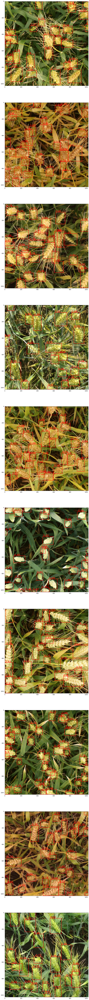

In [21]:
if COMMIT:
    fig, ax =plt.subplots(10, figsize=[150,150])
    count=0
    for images, image_ids in test_loader:
        predictions = make_tta_predictions(images,model=new_test_net)
        for i, image in enumerate(images):
            boxes, scores, labels = run_wbf(predictions, image_index=i)
            boxes = (boxes).astype(np.int32).clip(min=0, max=1023)
            image_id = image_ids[i]
            
            indexes = np.where(scores > best_score_threshold)[0]
            boxes = boxes[indexes]

            font = cv2.FONT_HERSHEY_SIMPLEX 
            # fontScale 
            fontScale = 1

            # Blue color in BGR 
            color = (255, 0, 0) 

            # Line thickness of 2 px 
            thickness = 2
            image=image.cpu().data.numpy()
            image = image.transpose(1,2,0)
            for b,s in zip(boxes,scores):
                image = cv2.rectangle(image, (b[0],b[1]), (b[2],b[3]), color, thickness) 
                image = cv2.putText(image, '{:.2}'.format(s), (b[0]+np.random.randint(20),b[1]), font,  
                               fontScale, color, thickness, cv2.LINE_AA)
            #plt.figure(figsize=[20,20])
            ax[count].imshow(image)
            count+=1
            
    plt.show()